In [1]:
# import warnings
# warnings.simplefilter(action='ignore', category=FutureWarning)
# import pandas as pd
# pd.options.display.float_format = '{:.2f}'.format

In [118]:
import pandas as pd
import math
import seaborn as sns
from matplotlib import pyplot as plt
import re
import numpy as np
import geopandas as gpd
from shapely.geometry import Point # Point class
from shapely.geometry import shape
import io
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="geoapiExercises")
from geopy.geocoders import Nominatim
from time import sleep
from datetime import datetime

In [119]:
# read the daily Volume
doh_weekday_factor=pd.read_csv('H:/Desktop/Bike_ped Exposure Model Project/Processed Data/four_year_ave_HOD_weekday.csv')
doh_weekend_factor=pd.read_csv('H:/Desktop/Bike_ped Exposure Model Project/Processed Data/four_year_ave_HOD_weekend.csv')

In [120]:
doh_weekday_factor.head(5)

,Unnamed: 0,ID,starttime,Average_Yearly_HOD_Factor
0,0,671,00:00:00,0.000458
1,1,671,01:00:00,0.000409
2,2,671,02:00:00,0.000021
3,3,671,03:00:00,0.000064
4,4,671,04:00:00,0.000172


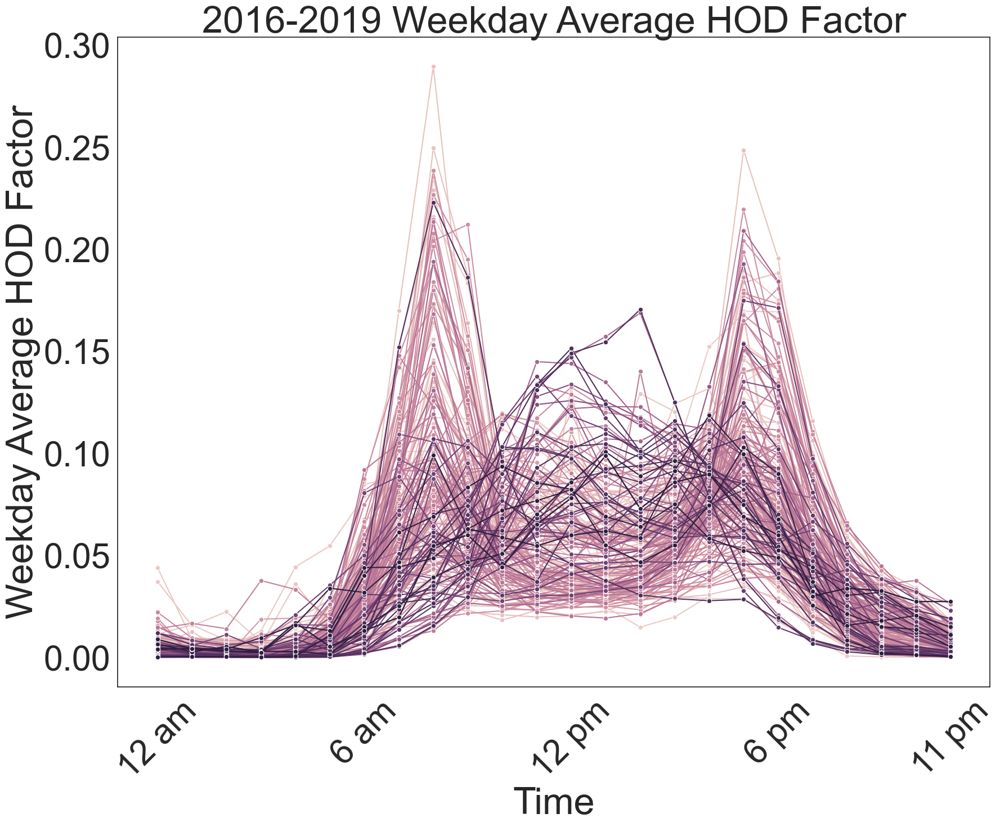

In [4]:
# Combined all 4 years together
import seaborn as sns

sns.set(rc={'figure.figsize':(20,15)})
sns.set(context='notebook', style='white', palette='deep', font='sans-serif', font_scale=4, color_codes=False, rc=None)
#fig, ax = plt.subplots(2,2)

ax=sns.lineplot(x=doh_weekday_factor['starttime'],y=doh_weekday_factor['Average_Yearly_HOD_Factor'],hue=doh_weekday_factor['ID'],
                   markers=True,marker="o", dashes=False,sort=True) 
plt.xticks([0,6, 12,18,23], ['12 am','6 am','12 pm','6 pm','11 pm'])
plt.xticks(rotation = 45)
ax.get_legend().remove()
ax.title.set_text('2016-2019 Weekday Average HOD Factor')
ax.set_ylabel('Weekday Average HOD Factor' )
ax.set_xlabel('Time')
plt.show()

In [5]:
# read the indices
ind=pd.read_csv('H:/Desktop/Bike_ped Exposure Model Project/Processed Data/Updated_indices.csv')
ind.head()

,Unnamed: 0.1,ID,year,Max_WWI,Average_WWI,Weekday_Aergage_AMI,Weekend_Aergage_AMI,Average AMI_wday_wend,Max_weekend_AMI,Max_weekday_AMI,...,state,country,Unnamed: 0,edgeUID,osmId,stv_total,stv_com_total,stv_rec_total,stv_com_ratio,stv_rec_ratio
0,0,671,2016,2.232143,0.769600,0.703185,0.324525,2.166812,0.360694,0.930693,...,California,United States,0,308723101,215845474,NaN,NaN,NaN,NaN,NaN
1,1,671,2017,2.893617,0.776723,0.743791,0.376689,1.974549,0.437975,1.020619,...,California,United States,0,308723101,215845474,NaN,NaN,NaN,NaN,NaN
2,2,671,2018,1.352564,0.710009,0.863646,0.291176,2.966061,0.295405,1.433566,...,California,United States,0,308723101,215845474,4890.0,260.0,4630.0,0.053170,0.946830
3,3,671,2019,1.435644,0.660785,0.820369,0.340759,2.407476,0.354620,1.210702,...,California,United States,0,308723101,215845474,4625.0,255.0,4370.0,0.055135,0.944865
4,4,1127,2016,2.222222,0.257277,2.050485,0.584499,3.508108,0.736655,2.235149,...,California,United States,1,308779961,87297166,NaN,NaN,NaN,NaN,NaN


In [6]:
ind.shape

(595, 40)

# Separate weekday Pattern using Max weekday AMI_PMI Value threshold

In [7]:
ind['county'].unique()

array([nan, 'Orange County', 'Alameda County', 'San Diego County',
       'CAL Fire San Diego Unit', 'Marin County', 'San Mateo County',
       'Los Angeles County', 'Contra Costa County', 'El Dorado County',
       'Douglas County', 'Placer County', 'Washoe County',
       'Humboldt County', 'San Luis Obispo County'], dtype=object)

In [8]:
# exclude El darado county
ind1=ind.loc[ind['county']!='El Dorado County']
ind2=ind1.loc[ind['county']!='Douglas County']
ind3=ind2.loc[ind['county']!='Placer County']

In [9]:
ind.columns

Index(['Unnamed: 0.1', 'ID', 'year', 'Max_WWI', 'Average_WWI',
       'Weekday_Aergage_AMI', 'Weekend_Aergage_AMI', 'Average AMI_wday_wend',
       'Max_weekend_AMI', 'Max_weekday_AMI', 'Daily_Max_AMI', 'Daily_Max_PMI',
       'Weekday_Aergage_PMI', 'Weekend_Aergage_PMI', 'Average PMI_wday_wend',
       'Max_weekday_PMI', 'Max_weekend_PMI', 'max_daily_am_pm',
       'max_daily_am/pm_value', 'max_weekend_am/pm', 'max_weekend_am_pm_Value',
       'max_weekday_am/pm', 'max_weekday_am_pm_value', 'seasonal_factor',
       'latitude', 'longitude', 'location', 'road', 'city', 'county', 'state',
       'country', 'Unnamed: 0', 'edgeUID', 'osmId', 'stv_total',
       'stv_com_total', 'stv_rec_total', 'stv_com_ratio', 'stv_rec_ratio'],
      dtype='object')

In [10]:
doh_weekday_factor.columns

Index(['Unnamed: 0', 'ID', 'starttime', 'Average_Yearly_HOD_Factor'], dtype='object')

In [11]:
max_ami_pmi=pd.DataFrame({'Average_max_ami_pmi':ind.groupby(['ID'])['max_weekday_am_pm_value'].mean()}).reset_index()
max_ami_pmi.shape

(184, 2)

In [12]:
max_ami_pmi['Average_max_ami_pmi'].describe()

count    183.000000
mean            inf
std             NaN
min        0.298198
25%        1.290880
50%        2.108637
75%        4.535714
max             inf
Name: Average_max_ami_pmi, dtype: float64

In [13]:
doh_weekday_factor.shape

(5160, 4)

In [14]:
weekday_data=pd.merge(doh_weekday_factor,max_ami_pmi, left_on=['ID'],right_on=['ID'],how='inner')
weekday_data.columns

Index(['Unnamed: 0', 'ID', 'starttime', 'Average_Yearly_HOD_Factor',
       'Average_max_ami_pmi'],
      dtype='object')

In [15]:
def plot (weekday_data):
    import seaborn as sns
    sns.set(rc={'figure.figsize':(20,15)})
    sns.set(context='notebook', style='white', palette='deep', font='sans-serif', font_scale=5, color_codes=False, rc=None)



    #fig, ax = plt.subplots(2,2)

    ax=sns.lineplot(x=weekday_data['starttime'],y=weekday_data['Average_Yearly_HOD_Factor'],hue=weekday_data['ID'],
                       markers=True,marker="o", dashes=False,sort=True)
    plt.xticks([0,6, 12,18,23], ['12 am','6 am','12 pm','6 pm','11 pm'])
    plt.xticks(rotation = 45)
    ax.set(ylim=(0, 0.30))
    ax.get_legend().remove()
    #ax.title.set_text('2016-2019 Weekday Average HOD Factor')
    ax.set_ylabel('Weekday Average HOD Factor' )
    ax.set_xlabel('Time')
    plt.show()

In [16]:
def plot_ave (d1_ave):
    import seaborn as sns
    sns.set(rc={'figure.figsize':(20,15)})
    sns.set(context='notebook', style='white', palette='deep', font='sans-serif', font_scale=5, color_codes=False, rc=None)



    #fig, ax = plt.subplots(2,2)

    ax=sns.lineplot(x=d1_ave['starttime'],y=d1_ave['Average_Group_HOD_Factor'],
                       markers=True,marker="o", dashes=False, sort=True) 
    plt.xticks([0,6, 12,18,23], ['12 am','6 am','12 pm','6 pm','11 pm'])
    plt.xticks(rotation = 45)
    ax.set(ylim=(0, 0.30))
    #ax.title.set_text('2016-2019 Weekday Average HOD Factor')
    ax.set_ylabel('Weekday Average HOD Factor' )
    ax.set_xlabel('Time')
    plt.show()

In [17]:
from pandas.api.types import CategoricalDtype
cats = [ '0:00:00','1:00:00','2:00:00','3:00:00','4:00:00','5:00:00','6:00:00','7:00:00','8:00:00','9:00:00','10:00:00','11:00:00','12:00:00','13:00:00','14:00:00','15:00:00','16:00:00','17:00:00','18:00:00','19:00:00','20:00:00','21:00:00','22:00:00','23:00:00']
cat_type = CategoricalDtype(categories=cats, ordered=True)


In [18]:
d1=weekday_data.loc[weekday_data['Average_max_ami_pmi']<=1.0]
d1_ave=pd.DataFrame({'Average_Group_HOD_Factor':d1.groupby(['starttime'])['Average_Yearly_HOD_Factor'].mean()}).reset_index()
d2=weekday_data[(weekday_data.Average_max_ami_pmi>1)& (weekday_data.Average_max_ami_pmi<=2.5) ]
d2_ave=pd.DataFrame({'Average_Group_HOD_Factor':d2.groupby(['starttime'])['Average_Yearly_HOD_Factor'].mean()}).reset_index()
#d3=weekend_data[(weekend_data.Average_max_ami_pmi>2.5)& (weekend_data.Average_max_ami_pmi<=3.5) ]
d3=weekday_data.loc[weekday_data['Average_max_ami_pmi']>2.5]
d3_ave=pd.DataFrame({'Average_Group_HOD_Factor':d3.groupby(['starttime'])['Average_Yearly_HOD_Factor'].mean()}).reset_index()

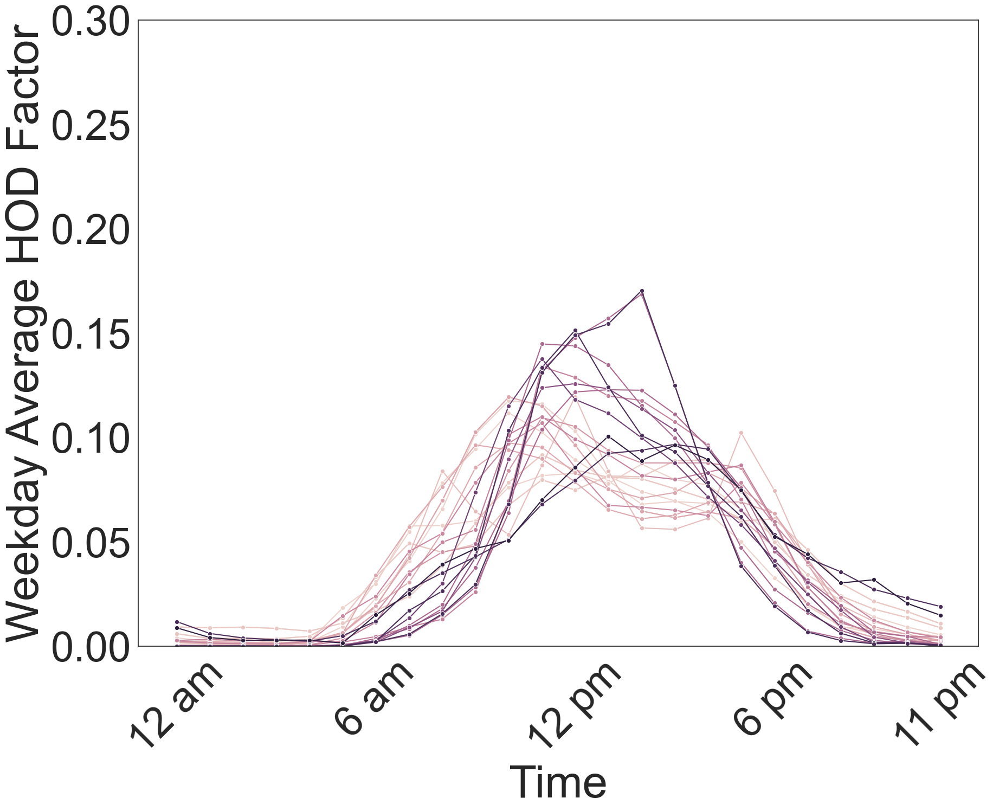

In [19]:
plot(d1)

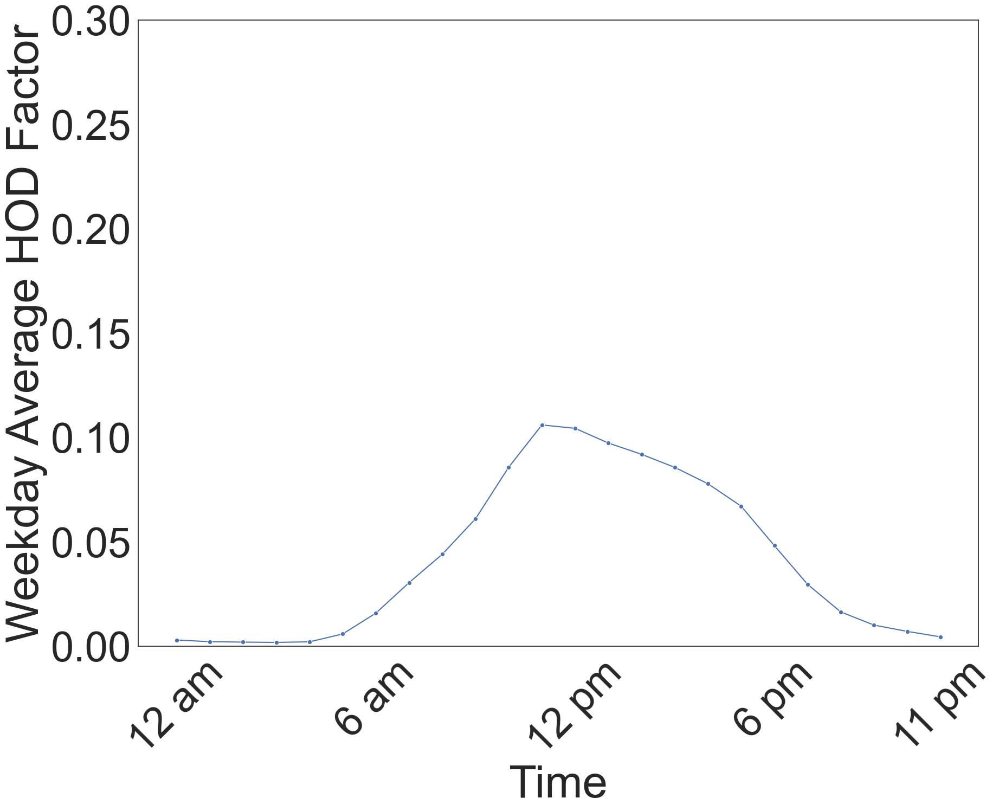

In [20]:
#d1_ave['starttime'] = d1_ave['starttime'].astype(cat_type)
plot_ave(d1_ave)

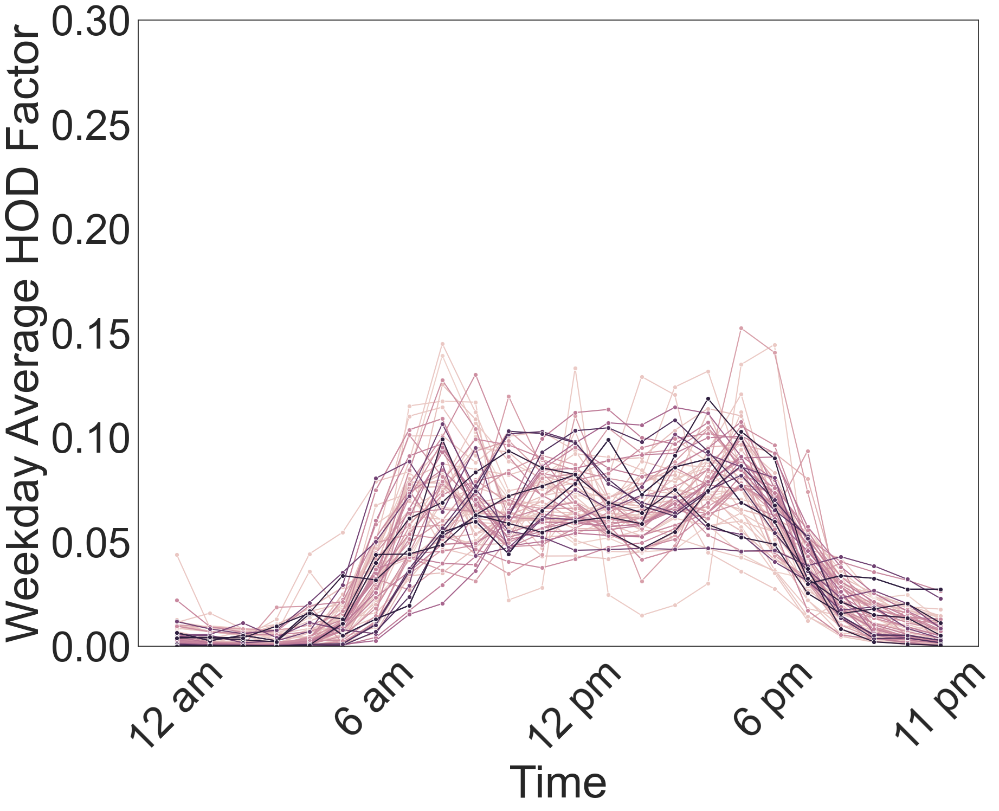

In [21]:
plot(d2)

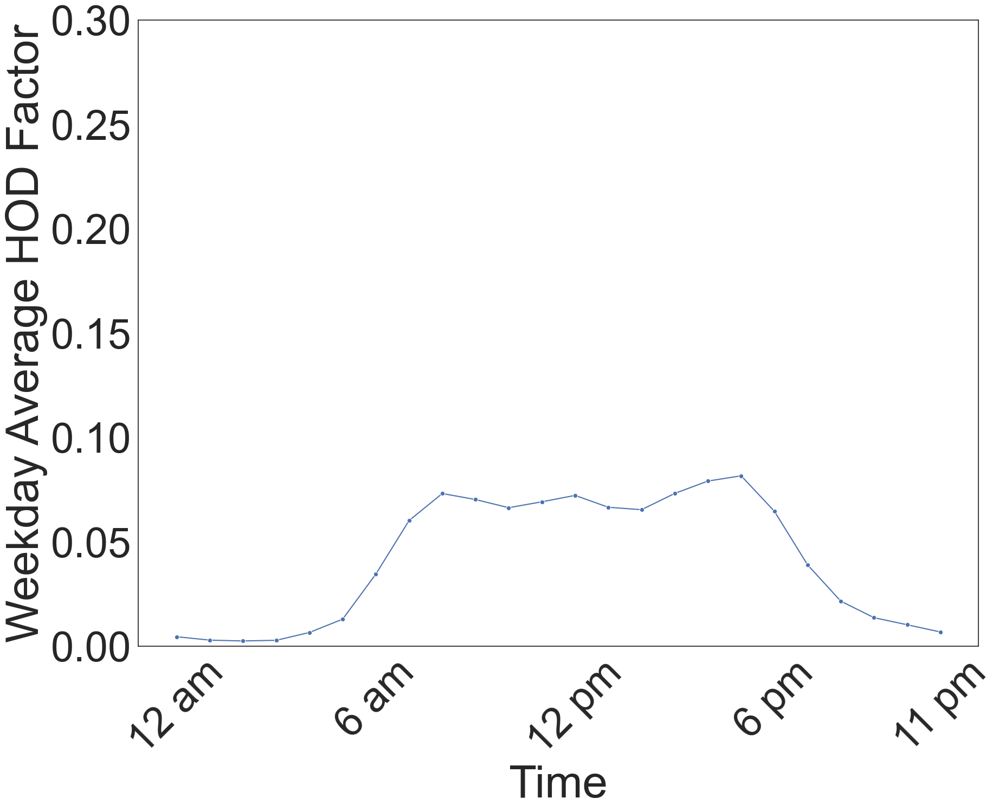

In [22]:
#d2_ave['starttime'] = d2_ave['starttime'].astype(cat_type)
plot_ave(d2_ave)

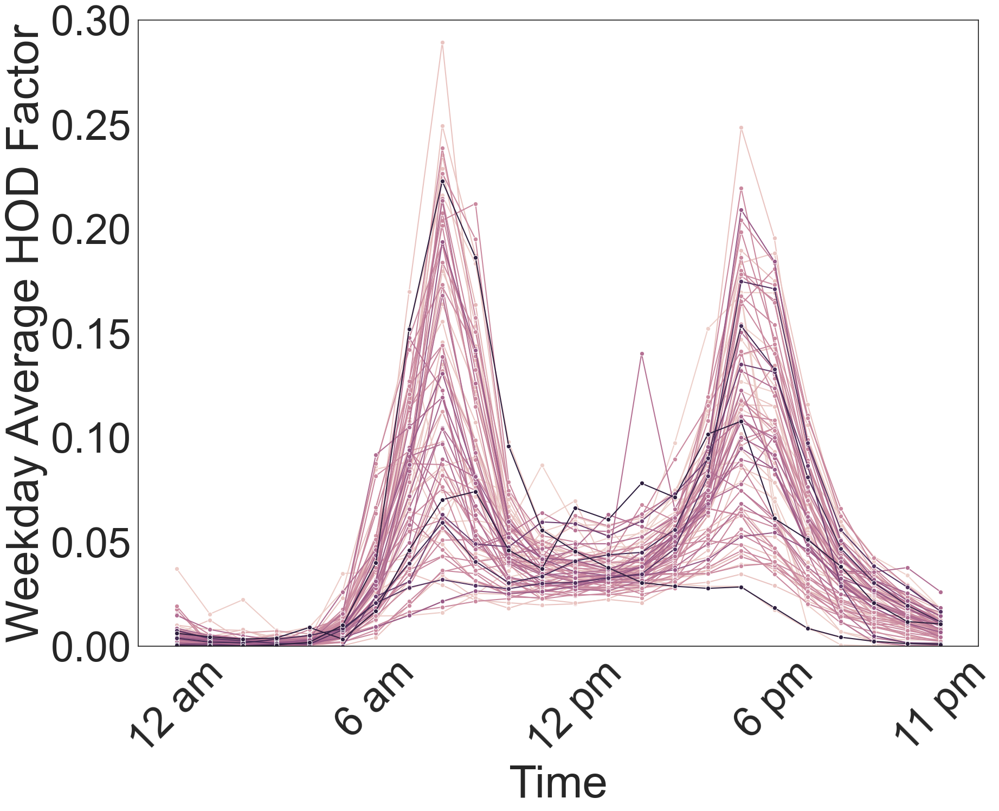

In [23]:
plot(d3)

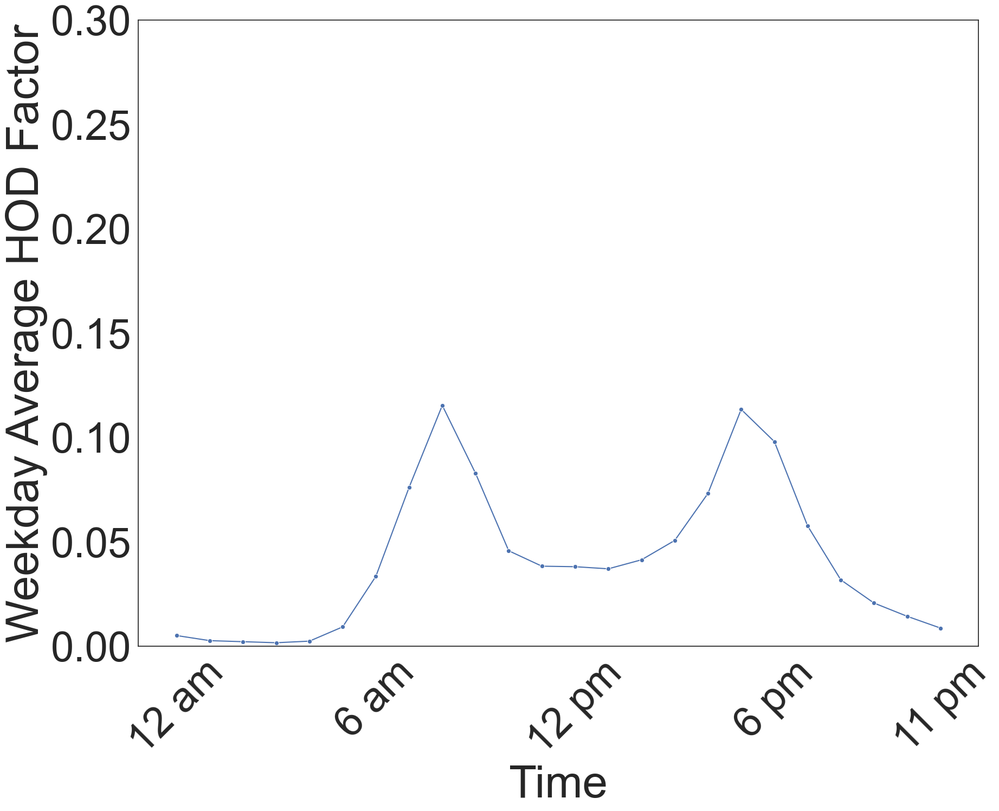

In [24]:
#d3_ave['starttime'] = d3_ave['starttime'].astype(cat_type)
plot_ave(d3_ave)

In [25]:
d1_ave=d1_ave.sort_values(by=['starttime'])
d2_ave=d2_ave.sort_values(by=['starttime'])
d3_ave=d3_ave.sort_values(by=['starttime'])

# Export Final HOD Factor

In [26]:
d1_ave['Criteria']='Max_AMI_PMI<=1'
d2_ave['Criteria']='1<Max_AMI_PMI<=2.5'
d3_ave['Criteria']='Max_AMI_PMI>2.5'
Final_weekday_HOD=pd.concat([d1_ave,d2_ave,d3_ave],axis=0)
Final_weekday_HOD['day_of_status']='weekday'
Final_weekday_HOD.to_csv('H:/Desktop/Bike_ped Exposure Model Project/Final Factor/Weekday_HOD_Factor.csv')

In [27]:
d1_ave.dtypes

starttime                    object
Average_Group_HOD_Factor    float64
Criteria                     object
dtype: object

# Separate weekend Pattern using Max weekday AMI_PMI Value threshold

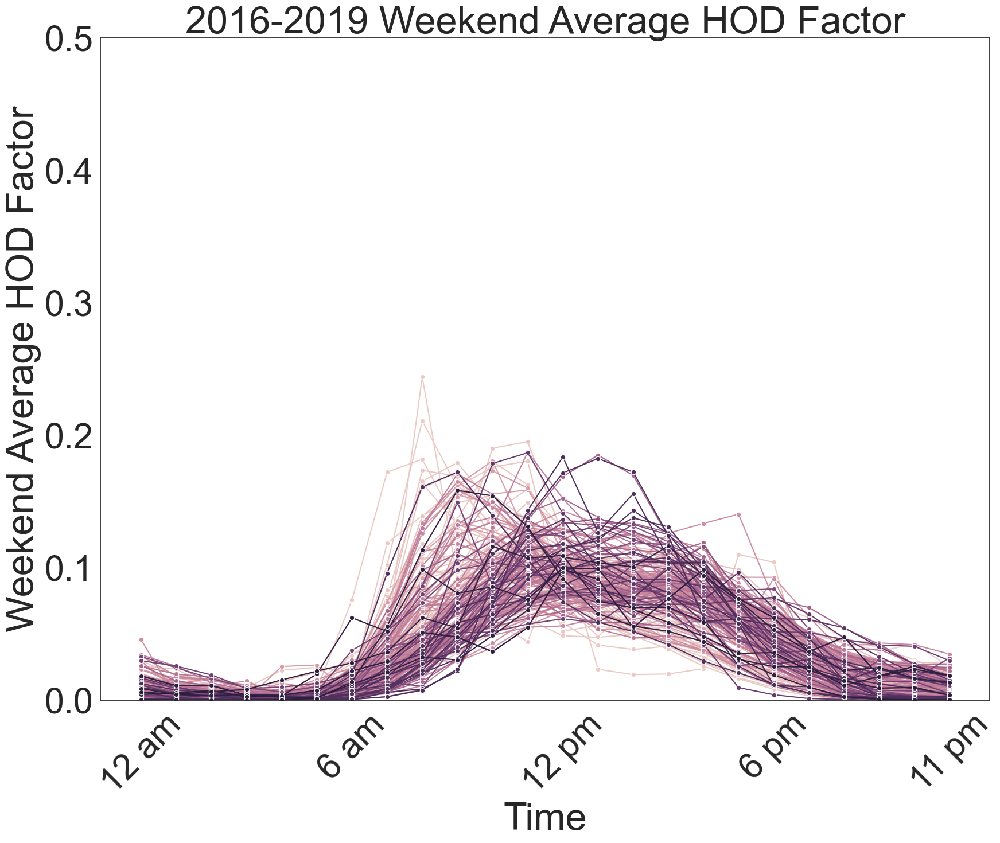

In [28]:
sns.set(rc={'figure.figsize':(20,15)})
sns.set(context='notebook', style='white', palette='deep', font='sans-serif', font_scale=4, color_codes=False, rc=None)
import seaborn as sns


#fig, ax = plt.subplots(2,2)

ax=sns.lineplot(x=doh_weekend_factor['starttime'],y=doh_weekend_factor['Average_Yearly_HOD_Factor'],hue=doh_weekend_factor['ID'],
                   markers=True,marker="o", dashes=False,sort=True)
plt.xticks([0,6, 12,18,23], ['12 am','6 am','12 pm','6 pm','11 pm'])
plt.xticks(rotation = 45)
ax.set(ylim=(0, 0.50))
ax.get_legend().remove()
ax.title.set_text('2016-2019 Weekend Average HOD Factor')
ax.set_ylabel('Weekend Average HOD Factor' )
ax.set_xlabel('Time')
plt.show()

In [29]:
max_ami_pmi_rec=pd.DataFrame({'Average_stv_rec_ratio':ind.groupby(['ID'])['stv_rec_ratio'].mean()}).reset_index()
max_ami_pmi_rec.shape

(184, 2)

In [30]:
max_ami_pmi_com=pd.DataFrame({'Average_stv_com_ratio':ind.groupby(['ID'])['stv_com_ratio'].mean()}).reset_index()
max_ami_pmi_com.shape

(184, 2)

In [31]:
max_ami_pmi_weekend=pd.merge(max_ami_pmi_rec,max_ami_pmi_com, left_on=['ID'],right_on=['ID'],how='inner')

In [32]:
max_ami_pmi_weekend.describe()

,ID,Average_stv_rec_ratio,Average_stv_com_ratio
count,184.000000,163.000000,163.000000
mean,17813.652174,0.721615,0.278385
std,15607.138487,0.218743,0.218743
min,671.000000,0.255080,0.000000
25%,3913.500000,0.551677,0.098082
50%,18374.500000,0.798981,0.201019
75%,23303.500000,0.901918,0.448323
max,59066.000000,1.000000,0.744920


In [33]:
weekend_data=pd.merge(doh_weekend_factor,max_ami_pmi_weekend, left_on=['ID'],right_on=['ID'],how='inner')
weekend_data.columns

Index(['Unnamed: 0', 'ID', 'starttime', 'Average_Yearly_HOD_Factor',
       'Average_stv_rec_ratio', 'Average_stv_com_ratio'],
      dtype='object')

In [34]:
c=weekend_data.loc[weekend_data['Average_Yearly_HOD_Factor']>0.25]
c

,Unnamed: 0,ID,starttime,Average_Yearly_HOD_Factor,Average_stv_rec_ratio,Average_stv_com_ratio


In [35]:
#weekend_data1=weekend_data.loc[weekend_data['ID']!=50994]
#weekend_data2=weekend_data1.loc[weekend_data1['ID']!=50997]

In [36]:
def plot_weekend (weekend_data):
    import seaborn as sns
    sns.set(rc={'figure.figsize':(20,15)})
    sns.set(context='notebook', style='white', palette='deep', font='sans-serif', font_scale=5, color_codes=False, rc=None)



    #fig, ax = plt.subplots(2,2)

    ax=sns.lineplot(x=weekend_data['starttime'],y=weekend_data['Average_Yearly_HOD_Factor'],hue=weekend_data['ID'],
                       markers=True,marker="o", dashes=False,sort=True) 
    plt.xticks([0,6, 12,18,23], ['12 am','6 am','12 pm','6 pm','11 pm'])
    plt.xticks(rotation = 45)
    ax.set(ylim=(0, 0.30))
    ax.get_legend().remove()
    #ax.title.set_text('2016-2019 Weekend Average HOD Factor')
    ax.set_ylabel('Weekend Average HOD Factor' )
    ax.set_xlabel('Time')
    plt.show()

In [37]:
def plot_weekend_ave (weekend_data):
    import seaborn as sns
    sns.set(rc={'figure.figsize':(20,15)})
    sns.set(context='notebook', style='white', palette='deep', font='sans-serif', font_scale=5, color_codes=False, rc=None)



    #fig, ax = plt.subplots(2,2)

    ax=sns.lineplot(x=weekend_data['starttime'],y=weekend_data['Average_Group_HOD_Factor'],
                       markers=True,marker="o", dashes=False,sort=True) 
    plt.xticks([0,6, 12,18,23], ['12 am','6 am','12 pm','6 pm','11 pm'])
    plt.xticks(rotation = 45)
    ax.set(ylim=(0, 0.30))
    #ax.title.set_text('2016-2019 Weekend Average HOD Factor')
    ax.set_ylabel('Weekend Average HOD Factor' )
    ax.set_xlabel('Time')
    plt.show()

In [38]:
d1w=weekend_data.loc[weekend_data['Average_stv_rec_ratio']<=0.75]
d1w_ave=pd.DataFrame({'Average_Group_HOD_Factor':d1w.groupby(['starttime'])['Average_Yearly_HOD_Factor'].mean()}).reset_index()
#d2w=weekend_data2[(weekend_data2.Average_stv_rec_ratio>0.6)& (weekend_data2.Average_stv_rec_ratio<=0.90) ]
#d3=weekend_data[(weekend_data.Average_max_ami_pmi>2.5)& (weekend_data.Average_max_ami_pmi<=3.5) ]
d2w=weekend_data.loc[weekend_data['Average_stv_rec_ratio']>0.75]
d2w_ave=pd.DataFrame({'Average_Group_HOD_Factor':d2w.groupby(['starttime'])['Average_Yearly_HOD_Factor'].mean()}).reset_index()

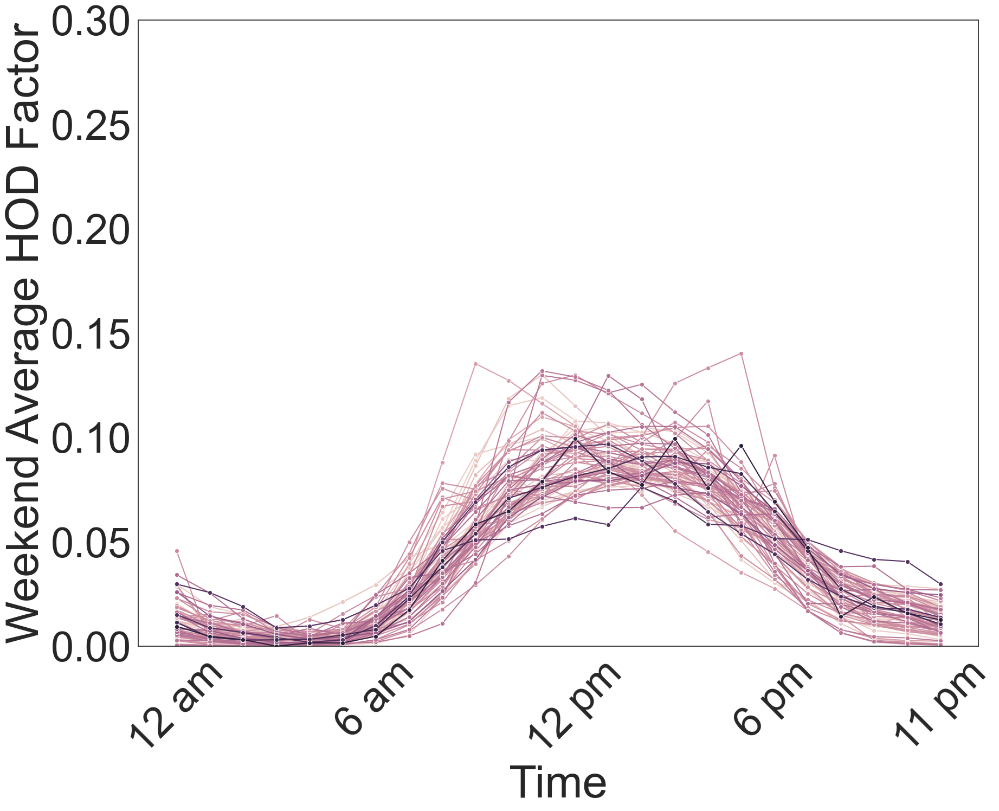

In [39]:
plot_weekend(d1w)

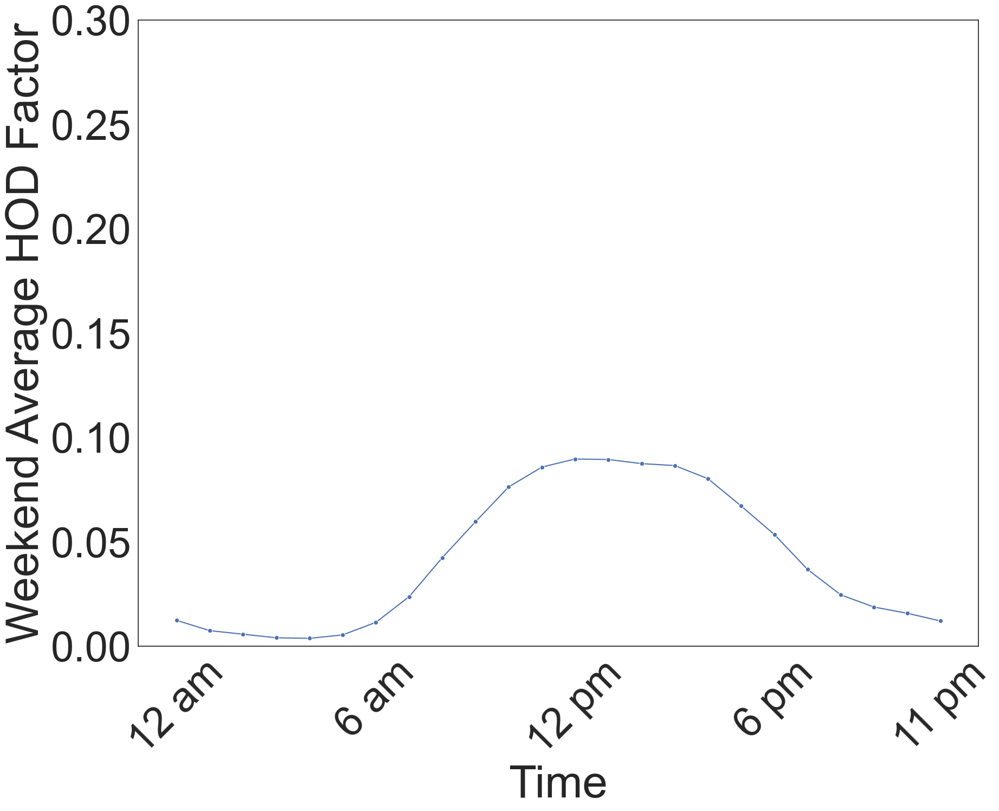

In [40]:
#d1w_ave['starttime'] = d1w_ave['starttime'].astype(cat_type)
plot_weekend_ave(d1w_ave)

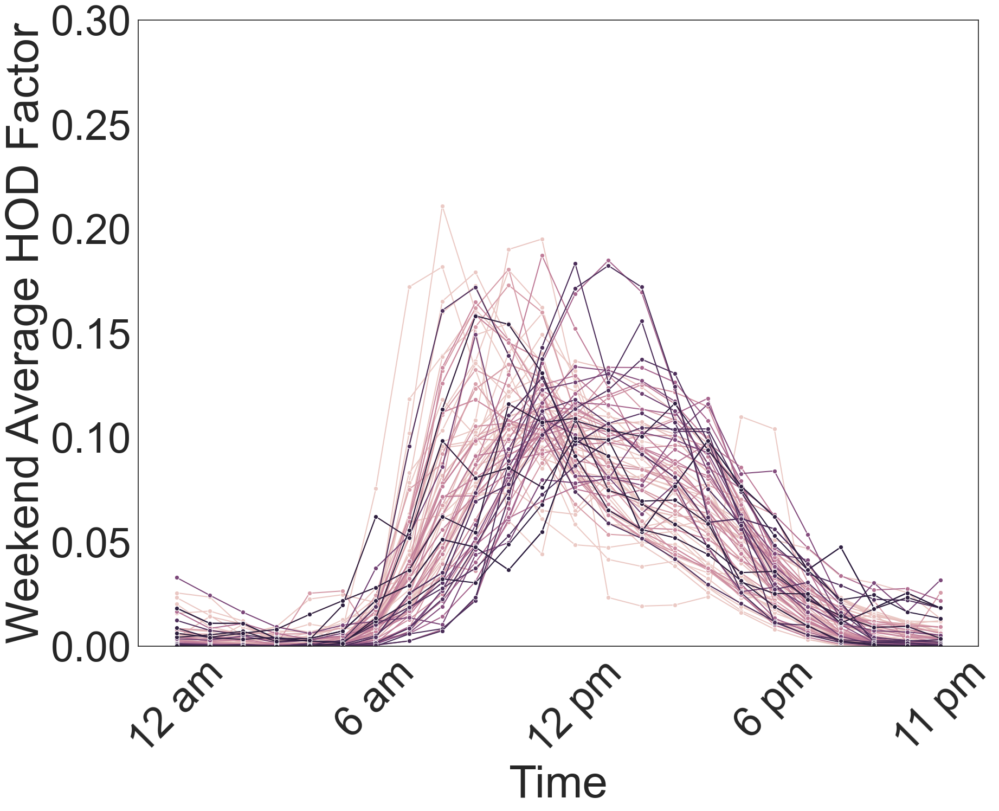

In [41]:
plot_weekend(d2w)

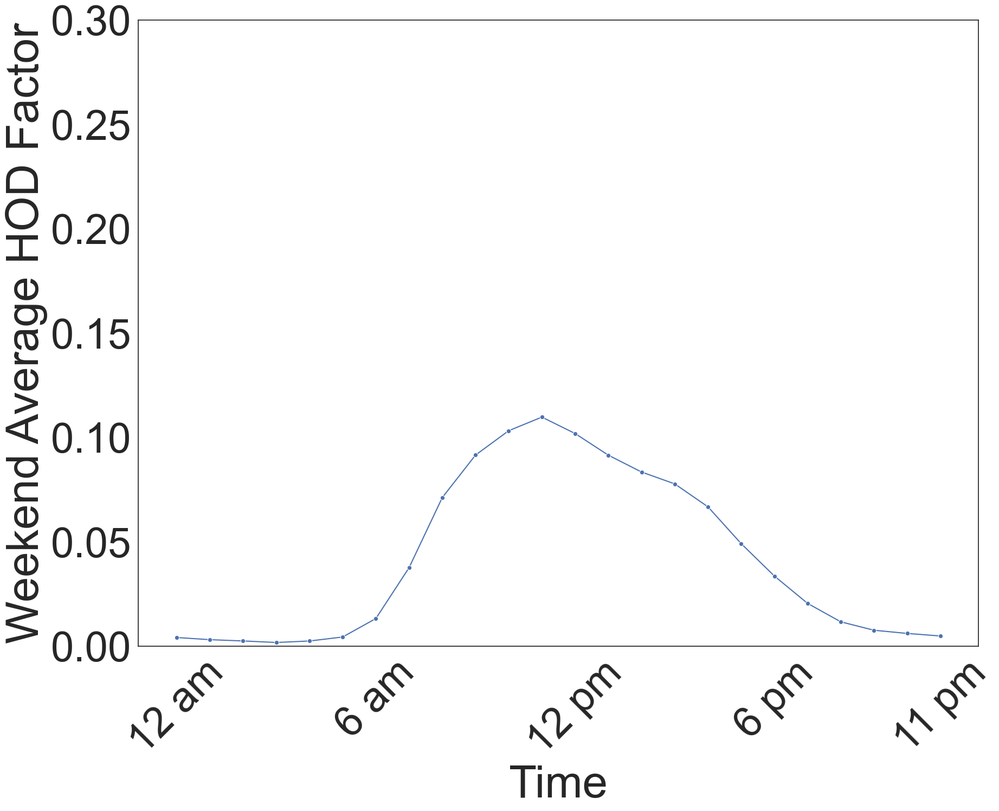

In [42]:
#d2w_ave['starttime'] = d2w_ave['starttime'].astype(cat_type)
plot_weekend_ave(d2w_ave)

In [43]:
# Import Final HOD Factor for weekend
d1w_ave=d1w_ave.sort_values(by=['starttime'])
d2w_ave=d2w_ave.sort_values(by=['starttime'])
d2w_ave.head(2)

,starttime,Average_Group_HOD_Factor
0,00:00:00,0.004161
1,01:00:00,0.003117


In [44]:
d1w_ave['Criteria']='Average_stv_rec_ratio<=0.75'
d2w_ave['Criteria']='Average_stv_rec_ratio>0.75'
Final_weekend_HOD=pd.concat([d1w_ave,d2w_ave],axis=0)
Final_weekend_HOD['day_of_status']='weekend'
Final_HOD=pd.concat([Final_weekday_HOD,Final_weekend_HOD],axis=0)
Final_HOD.to_csv('H:/Desktop/Bike_ped Exposure Model Project/Final Factor/Final_HOD_Factor.csv')

# Break Down DOW Factor Pattern based on WWI Index 0.4 amd >0.4

In [45]:
DOW=pd.read_csv('H:/Desktop/Bike_ped Exposure Model Project/Processed Data/four_year_ave_DOW.csv')
DOW.head()

,Unnamed: 0,ID,Day of Week,Average_Yearly_DOW_Factor
0,0,671,Monday,0.112940
1,1,671,Tuesday,0.119659
2,2,671,Wednesday,0.109831
3,3,671,Thursday,0.131505
4,4,671,Friday,0.122275


In [46]:
ind.columns

Index(['Unnamed: 0.1', 'ID', 'year', 'Max_WWI', 'Average_WWI',
       'Weekday_Aergage_AMI', 'Weekend_Aergage_AMI', 'Average AMI_wday_wend',
       'Max_weekend_AMI', 'Max_weekday_AMI', 'Daily_Max_AMI', 'Daily_Max_PMI',
       'Weekday_Aergage_PMI', 'Weekend_Aergage_PMI', 'Average PMI_wday_wend',
       'Max_weekday_PMI', 'Max_weekend_PMI', 'max_daily_am_pm',
       'max_daily_am/pm_value', 'max_weekend_am/pm', 'max_weekend_am_pm_Value',
       'max_weekday_am/pm', 'max_weekday_am_pm_value', 'seasonal_factor',
       'latitude', 'longitude', 'location', 'road', 'city', 'county', 'state',
       'country', 'Unnamed: 0', 'edgeUID', 'osmId', 'stv_total',
       'stv_com_total', 'stv_rec_total', 'stv_com_ratio', 'stv_rec_ratio'],
      dtype='object')

In [47]:
ave_wwi=pd.DataFrame({'Average_wwi':ind.groupby(['ID'])['Average_WWI'].mean()}).reset_index()
ave_wwi.shape

(184, 2)

In [48]:
DOW.shape, ind.shape

((1505, 4), (595, 40))

In [49]:
DOW_ind=pd.merge(DOW,ave_wwi,left_on=['ID'],right_on=['ID'],how='inner')
DOW_ind.shape

(1260, 5)

In [50]:
from pandas.api.types import CategoricalDtype
cats = [ 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
cat_type = CategoricalDtype(categories=cats, ordered=True)
DOW_ind['Day of Week'] = DOW_ind['Day of Week'].astype(cat_type)

In [102]:
def DOW_plot (DOW_ind):
    import seaborn as sns
    sns.set(rc={'figure.figsize':(20,15)})
    sns.set(context='notebook', style='white', palette='deep', font='sans-serif', font_scale=5, color_codes=False, rc=None)



    #fig, ax = plt.subplots(2,2)

    ax=sns.lineplot(x=DOW_ind['Day of Week'],y=DOW_ind['Average_Yearly_DOW_Factor'],hue=DOW_ind['ID'],
                       markers=True,marker="o", dashes=False,sort=True) 
    plt.xticks([0,1,2,3,4,5,6], ['Mo','Tu','We','Th','Fr','Sa','Su'])
    ax.set(ylim=(0, 0.40))
    ax.get_legend().remove()
    #ax.title.set_text('2016-2019 Average DOW Factor')
    ax.set_ylabel('Average DOW Factor' )
    ax.set_xlabel('Day of Week')
    plt.show()

In [112]:
def DOW_plot_ave (DOW_ind):
    import seaborn as sns
    
    sns.set(rc={'figure.figsize':(20,15)})
    sns.set(context='notebook', style='white', palette='deep', font='sans-serif', font_scale=5, color_codes=False, rc=None)



    #fig, ax = plt.subplots(2,2)

    ax=sns.lineplot(x=DOW_ind['Day of Week'],y=DOW_ind['Average_Group_DOW_Factor'],
                       markers=True,marker="o",linewidth=2, dashes=False,sort=True)
    plt.xticks(rotation = 0)
    plt.xticks([0,1,2,3, 4,5,6], ['Mo','Tu','We','Th','Fr','Sa','Su'])
    ax.set(ylim=(0, 0.40))
    #ax.title.set_text('2016-2019 Average DOW Factor')
    ax.set_ylabel('Average DOW Factor' )
    ax.set_xlabel('Day of Week')
    plt.show()

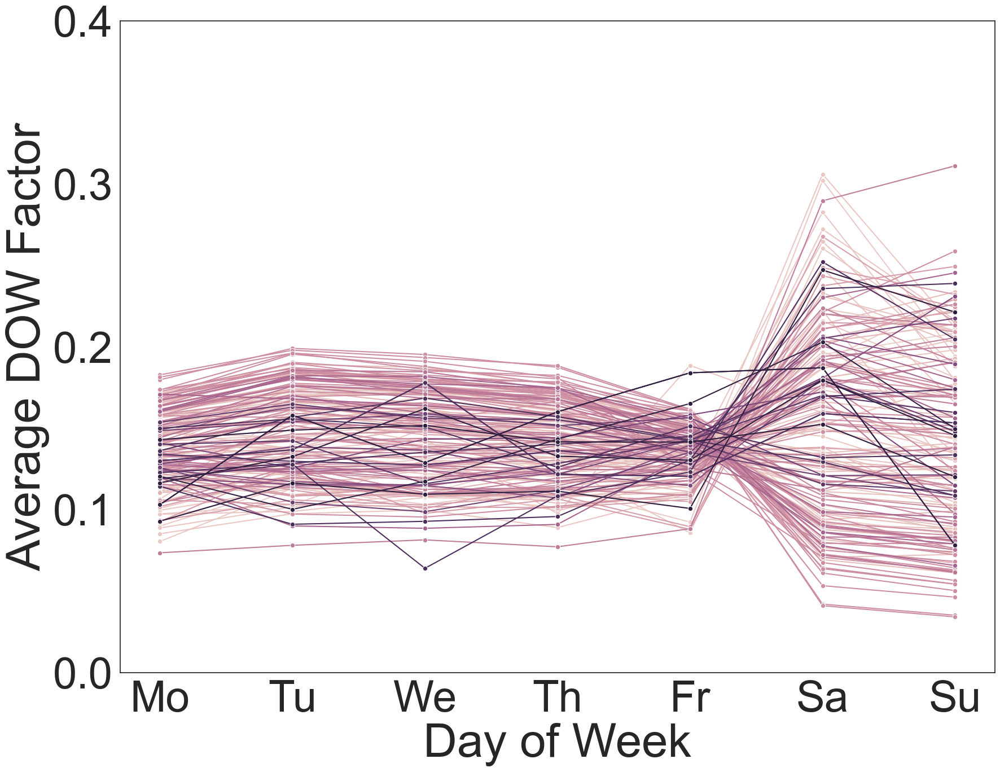

In [113]:
DOW_plot(DOW_ind)

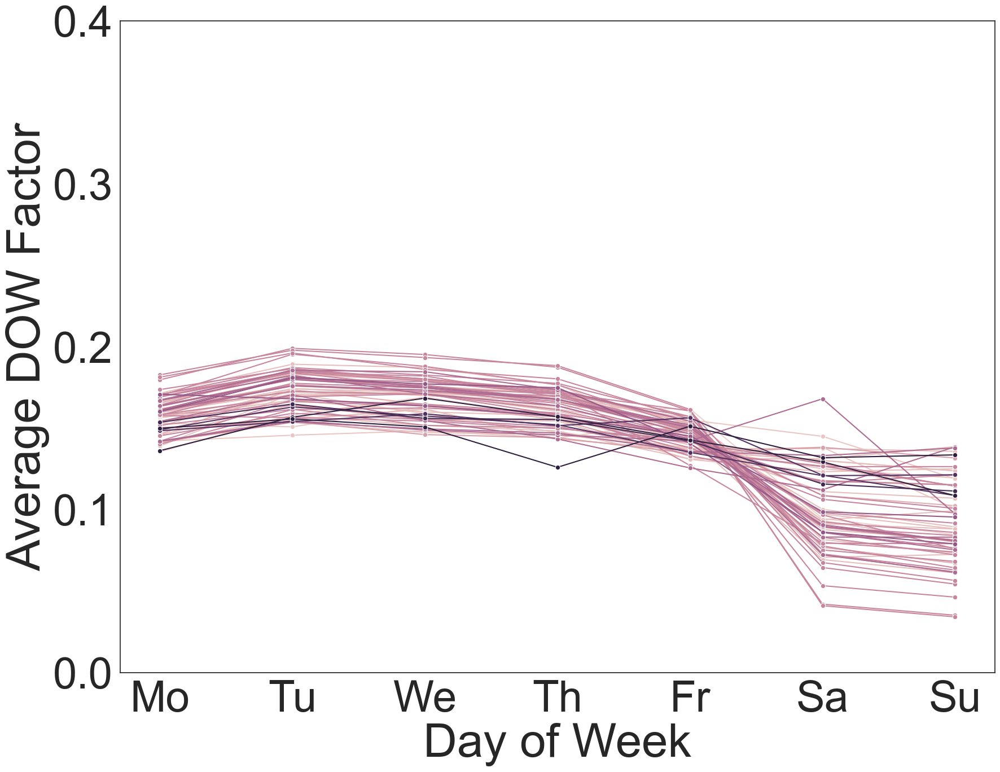

In [114]:
dow1=DOW_ind.loc[DOW_ind['Average_wwi']<=0.40]
dow1_ave=pd.DataFrame({'Average_Group_DOW_Factor':dow1.groupby(['Day of Week'])['Average_Yearly_DOW_Factor'].mean()}).reset_index()
DOW_plot(dow1)

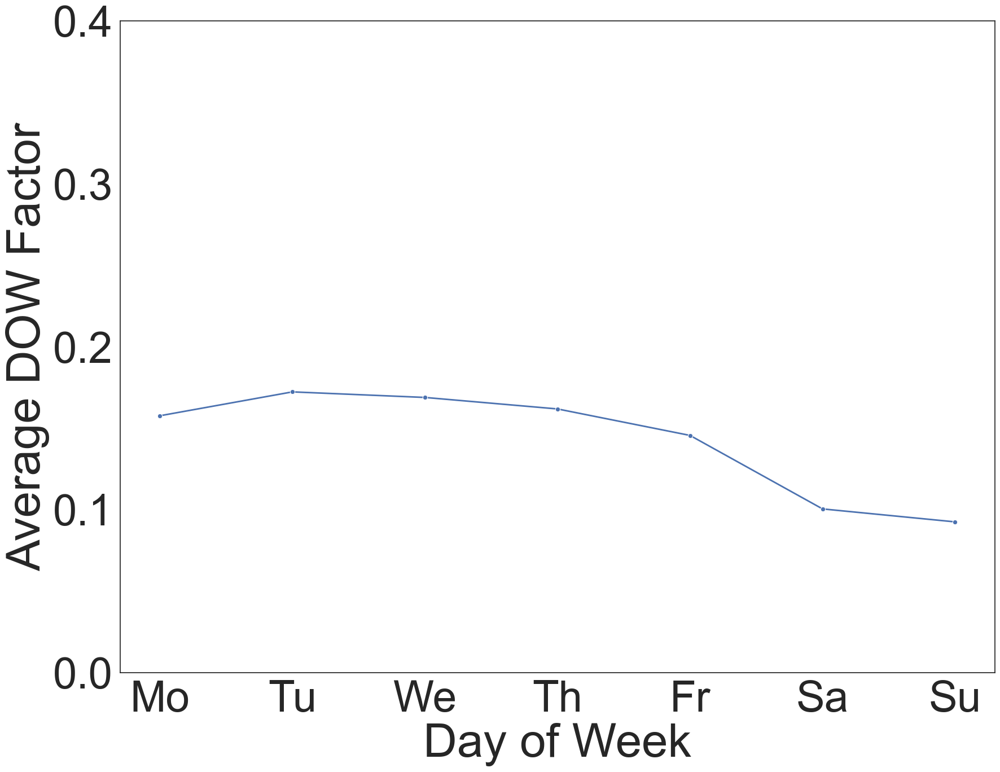

In [115]:
DOW_plot_ave(dow1_ave)

In [111]:
#dow2=DOW_ind[(DOW_ind.Average_wwi>0.35) & (DOW_ind.Average_wwi<=0.90)]
#DOW_plot(dow2)

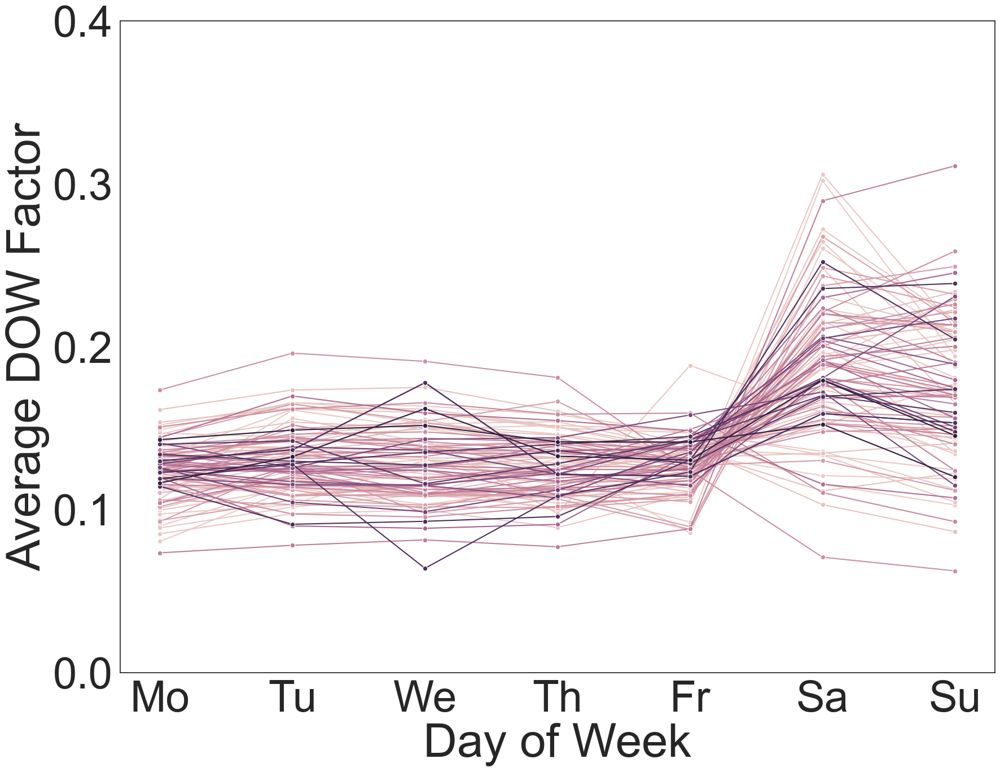

In [116]:
dow2=DOW_ind.loc[DOW_ind['Average_wwi']>0.40]
dow2_ave=pd.DataFrame({'Average_Group_DOW_Factor':dow2.groupby(['Day of Week'])['Average_Yearly_DOW_Factor'].mean()}).reset_index()
DOW_plot(dow2)

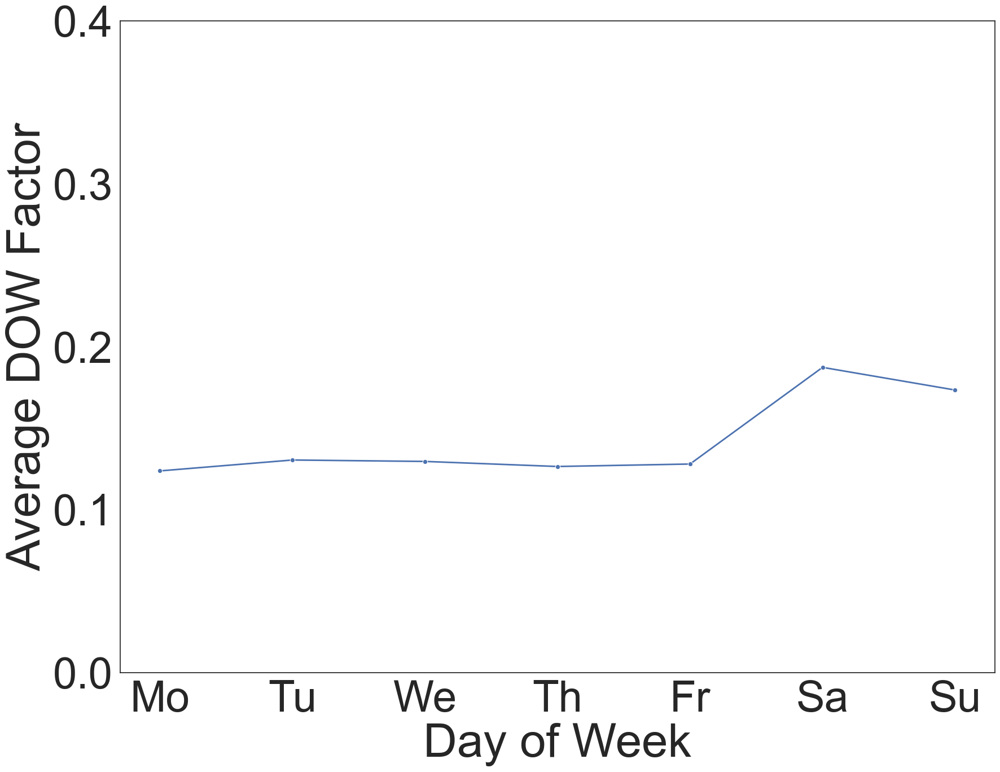

In [117]:
DOW_plot_ave(dow2_ave)

In [87]:
# export final DOW factor
dow1_ave['criteria']='WWI<=0.40'
dow2_ave['criteria']='WWI>0.40'
final_wwi=pd.concat([dow1_ave,dow2_ave],axis=0)
final_wwi.to_csv('H:/Desktop/Bike_ped Exposure Model Project/Final Factor/Final_DOW_Factor.csv')

# Breakdown MOY Pattern by seasonality factor

In [110]:
moy=pd.read_csv('H:/Desktop/Bike_ped Exposure Model Project/Processed Data/four_year_ave_MOY.csv')
moy.head()

,Unnamed: 0,ID,month,Average_Yearly_MOY_Factor
0,0,671,1,0.073279
1,1,671,2,0.064814
2,2,671,3,0.074801
3,3,671,4,0.087330
4,4,671,5,0.101495


In [111]:
moy.loc[moy['Average_Yearly_MOY_Factor']>0.25]

,Unnamed: 0,ID,month,Average_Yearly_MOY_Factor


In [112]:
moy.loc[moy['ID']==51027]

,Unnamed: 0,ID,month,Average_Yearly_MOY_Factor
2043,2043,51027,1,0.028446
2044,2044,51027,2,0.030674
2045,2045,51027,3,0.017185
2046,2046,51027,4,0.092845
2047,2047,51027,5,0.135015
2048,2048,51027,6,0.188739
2049,2049,51027,8,0.190147
2050,2050,51027,9,0.160880
2051,2051,51027,10,0.097478
2052,2052,51027,11,0.053431


In [113]:
ind.columns

Index(['Unnamed: 0.1', 'ID', 'year', 'Max_WWI', 'Average_WWI',
       'Weekday_Aergage_AMI', 'Weekend_Aergage_AMI', 'Average AMI_wday_wend',
       'Max_weekend_AMI', 'Max_weekday_AMI', 'Daily_Max_AMI', 'Daily_Max_PMI',
       'Weekday_Aergage_PMI', 'Weekend_Aergage_PMI', 'Average PMI_wday_wend',
       'Max_weekday_PMI', 'Max_weekend_PMI', 'max_daily_am_pm',
       'max_daily_am/pm_value', 'max_weekend_am/pm', 'max_weekend_am_pm_Value',
       'max_weekday_am/pm', 'max_weekday_am_pm_value', 'seasonal_factor',
       'latitude', 'longitude', 'location', 'road', 'city', 'county', 'state',
       'country', 'Unnamed: 0', 'edgeUID', 'osmId', 'stv_total',
       'stv_com_total', 'stv_rec_total', 'stv_com_ratio', 'stv_rec_ratio'],
      dtype='object')

In [114]:
ses_pa=pd.DataFrame({'Average_seasonal_factor':ind.groupby(['ID'])['seasonal_factor'].mean()}).reset_index()
ses_pa.shape

(184, 2)

In [115]:
ses_pa.loc[ses_pa['Average_seasonal_factor']>2.4]

,ID,Average_seasonal_factor
6,2698,4.236054
79,13426,3.037227
91,18374,2.828627
92,18375,2.925414
138,23305,2.902605
139,23307,2.768073
152,30664,24.760590
153,30665,8.636526
159,39406,2.478288
160,41347,2.897690


In [116]:
ses_pa['Average_seasonal_factor'].max()

24.76059041

In [118]:
# extract seasonality factor to classify geographically
uniq_lat_long=ind.drop_duplicates(subset=['ID'], keep='first')
uniq_lat_long1=uniq_lat_long[['ID','latitude', 'longitude','location', 'road', 'city', 'county', 'state','country' ]]
graphical_seasonality=pd.merge(uniq_lat_long1,ses_pa,left_on=['ID'],right_on=['ID'],how='inner')
graphical_seasonality.to_csv('H:/Desktop/Bike_ped Exposure Model Project/Processed Data/four_year_average_seasonality.csv')

In [119]:
MOY_ind=pd.merge(moy,ses_pa,left_on=['ID'],right_on=['ID'],how='inner')
MOY_ind.head()

,Unnamed: 0,ID,month,Average_Yearly_MOY_Factor,Average_seasonal_factor
0,0,671,1,0.073279,1.30774
1,1,671,2,0.064814,1.30774
2,2,671,3,0.074801,1.30774
3,3,671,4,0.087330,1.30774
4,4,671,5,0.101495,1.30774


In [120]:
check_anomally=MOY_ind.loc[MOY_ind['Average_seasonal_factor']>3]
check_anomally

,Unnamed: 0,ID,month,Average_Yearly_MOY_Factor,Average_seasonal_factor
47,47,2698,1,0.030789,4.236054
48,48,2698,2,0.076868,4.236054
49,49,2698,3,0.072063,4.236054
50,50,2698,4,0.109347,4.236054
51,51,2698,5,0.113367,4.236054
52,52,2698,6,0.102365,4.236054
53,53,2698,7,0.077430,4.236054
54,54,2698,8,0.086134,4.236054
55,55,2698,9,0.105120,4.236054
56,56,2698,10,0.085951,4.236054


In [170]:
def MOY_plot (MOY_ind):
    import seaborn as sns
    sns.set(rc={'figure.figsize':(20,15)})
    sns.set(context='notebook', style='white', palette='deep', font='sans-serif', font_scale=5, color_codes=False, rc=None)



    #fig, ax = plt.subplots(2,2)

    ax=sns.lineplot(x=MOY_ind['month'],y=MOY_ind['Average_Yearly_MOY_Factor'],hue=MOY_ind['ID'],
                       markers=True,marker="o", dashes=False,sort=True) 
    plt.xticks(rotation = 0)
    plt.xticks([2,4, 6,8,10,12], ['2','4','6','8','10','12'])
    ax.set(ylim=(0, 0.40))
    ax.get_legend().remove()
    #ax.title.set_text('2016-2019 Average MOY Factor')
    ax.set_ylabel('Average MOY Factor' )
    ax.set_xlabel('Month')
    plt.show()

In [171]:
def MOY_plot_ave (MOY_ind):
    import seaborn as sns
    sns.set(rc={'figure.figsize':(20,15)})
    sns.set(context='notebook', style='white', palette='deep', font='sans-serif', font_scale=5, color_codes=False, rc=None)



    #fig, ax = plt.subplots(2,2)

    ax=sns.lineplot(x=MOY_ind['month'],y=MOY_ind['Average_Group_MOY_Factor'],
                       markers=True,marker="o", dashes=False,sort=True) 
    plt.xticks(rotation = 0)
    plt.xticks([2,4, 6,8,10,12], ['2','4','6','8','10','12'])
    ax.set(ylim=(0, 0.40))
    #ax.title.set_text('2016-2019 Average MOY Factor')
    ax.set_ylabel('Average MOY Factor' )
    ax.set_xlabel('Month')
    plt.show()

In [172]:
d1m=MOY_ind.loc[MOY_ind['Average_seasonal_factor']<=2.4]
d1m_ave=pd.DataFrame({'Average_Group_MOY_Factor':d1m.groupby(['month'])['Average_Yearly_MOY_Factor'].mean()}).reset_index()
d2m=MOY_ind[(MOY_ind.Average_seasonal_factor>2.4)& (MOY_ind.Average_seasonal_factor<=5) ]
d2m_ave=pd.DataFrame({'Average_Group_MOY_Factor':d2m.groupby(['month'])['Average_Yearly_MOY_Factor'].mean()}).reset_index()
d3m=MOY_ind.loc[MOY_ind['Average_seasonal_factor']>5]
d3m_ave=pd.DataFrame({'Average_Group_MOY_Factor':d3m.groupby(['month'])['Average_Yearly_MOY_Factor'].mean()}).reset_index()

In [173]:
d2m['Average_seasonal_factor'].describe()

count    95.000000
mean      3.010421
std       0.493577
min       2.478288
25%       2.798350
50%       2.902605
75%       2.981321
max       4.236054
Name: Average_seasonal_factor, dtype: float64

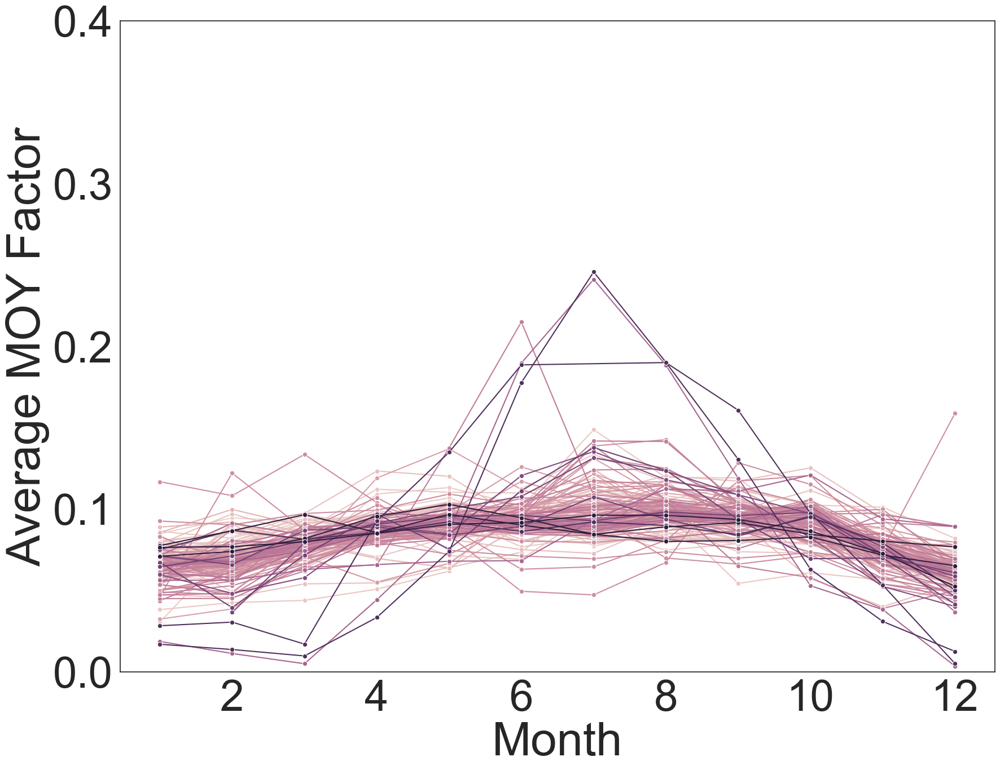

In [174]:
# all four years
MOY_plot(MOY_ind)

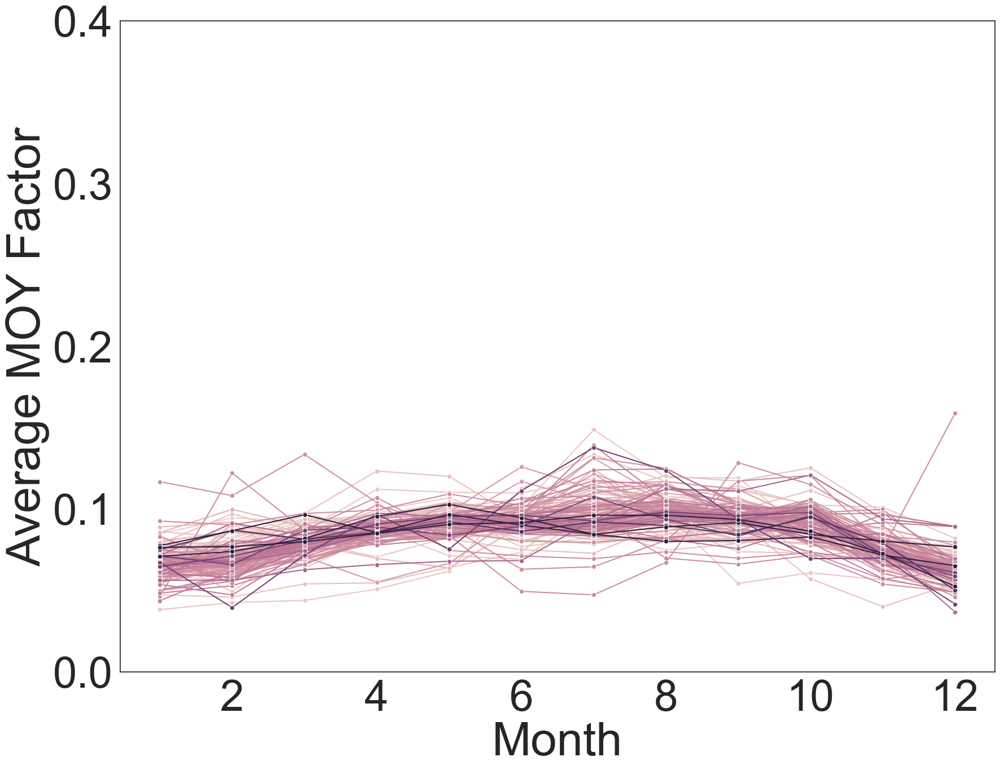

In [175]:
MOY_plot(d1m)

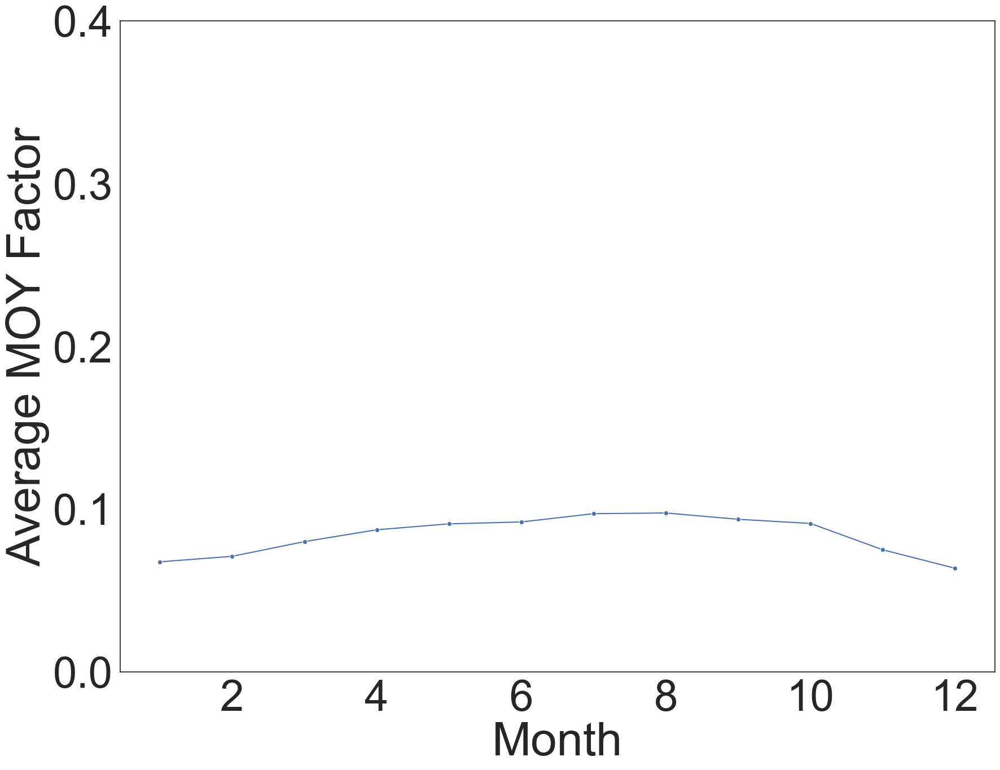

In [176]:
MOY_plot_ave(d1m_ave)

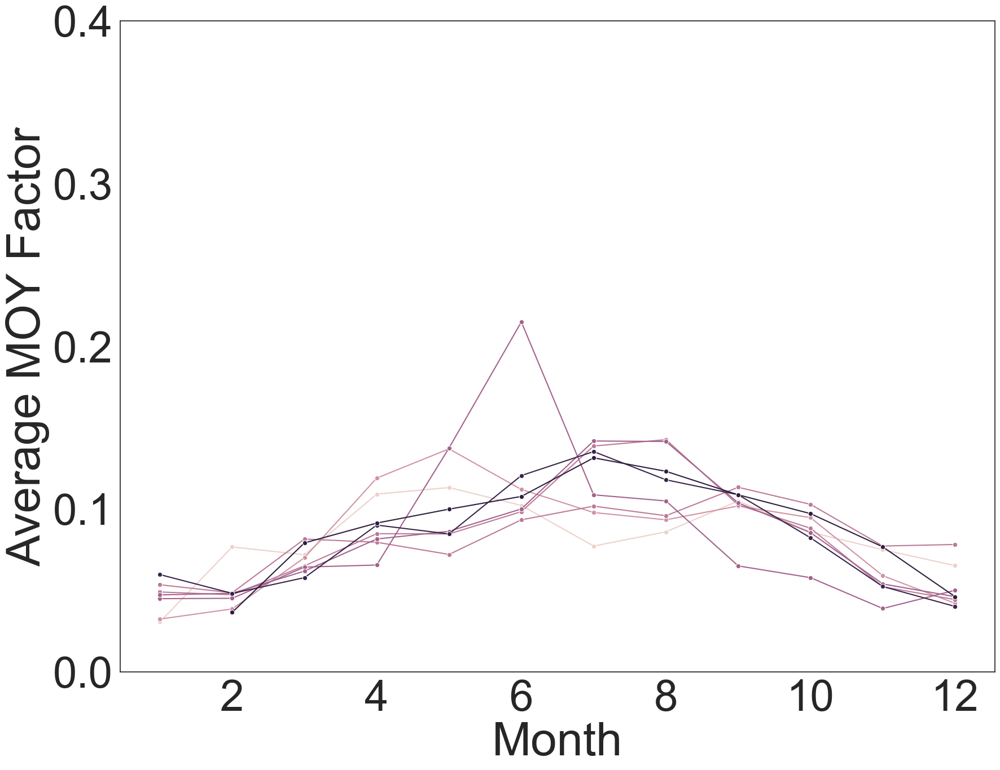

In [177]:
MOY_plot(d2m)

In [178]:
d2m_v1=d2m.drop_duplicates(subset=['ID'], keep='first')
d2m_v1.shape

(8, 5)

In [179]:
# check are these counter located
c=ind['ID'].isin(d2m_v1['ID'])
loc_id=ind[c]
loc_id_v1=loc_id.drop_duplicates(subset=['ID'], keep='first')
loc_id_v1

,Unnamed: 0.1,ID,year,Max_WWI,Average_WWI,Weekday_Aergage_AMI,Weekend_Aergage_AMI,Average AMI_wday_wend,Max_weekend_AMI,Max_weekday_AMI,...,state,country,Unnamed: 0,edgeUID,osmId,stv_total,stv_com_total,stv_rec_total,stv_com_ratio,stv_rec_ratio
15,15,2698,2016,2.529412,0.964554,1.252186,1.914433,0.654077,2.071795,1.601770,...,California,United States,7,311886927,787298838,NaN,NaN,NaN,NaN,NaN
253,253,13426,2016,0.806250,0.400925,0.904439,1.320427,0.684959,1.616379,1.238683,...,California,United States,88,306403872,13324467,NaN,NaN,NaN,NaN,NaN
297,297,18374,2016,4.237226,0.910715,0.504263,0.205941,2.448585,0.215880,0.585242,...,California,United States,101,308707445,28691787,NaN,NaN,NaN,NaN,NaN
301,301,18375,2016,4.021394,0.656088,0.350185,0.128274,2.729972,0.145084,0.413402,...,California,United States,102,308775307,911701772,NaN,NaN,NaN,NaN,NaN
472,472,23305,2016,1.045093,0.584890,0.053002,0.038550,1.374881,0.038811,0.063527,...,California,United States,153,308773840,25319425,NaN,NaN,NaN,NaN,NaN
476,476,23307,2016,1.168662,0.556143,0.533455,0.120695,4.419873,0.127495,0.637576,...,California,United States,154,308775682,90094023,NaN,NaN,NaN,NaN,NaN
542,542,39406,2017,2.017544,0.845864,0.432205,0.247571,1.745778,0.298611,0.538462,...,California,United States,194,309785840,308320044,NaN,NaN,NaN,NaN,NaN
545,545,41347,2019,0.914634,0.403011,1.007726,0.140230,7.186236,0.220238,1.628635,...,California,United States,226,307111306,372527802,415.0,60.0,355.0,0.144578,0.855422


In [180]:
loc_id_v1.to_csv('H:/Desktop/Bike_ped Exposure Model Project/MOY_factorseasonality2_5c.csv')

In [181]:
loc_id_v1.groupby(['county'])['county'].count()

county
Alameda County     1
Humboldt County    1
Orange County      2
Name: county, dtype: int64

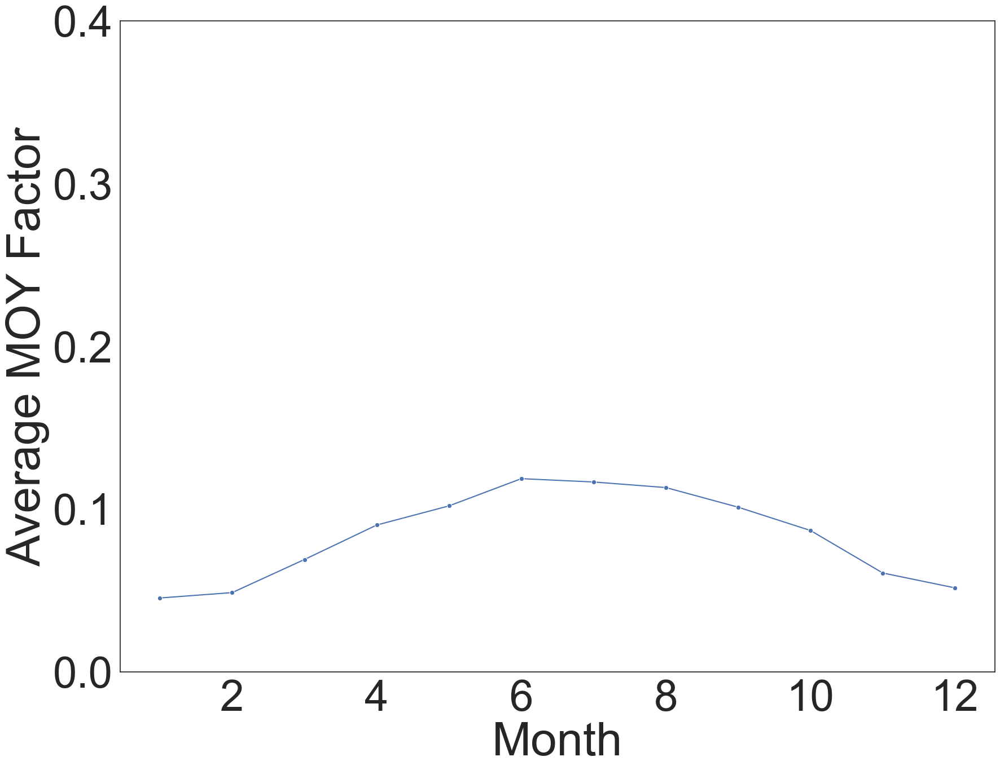

In [182]:
MOY_plot_ave(d2m_ave)

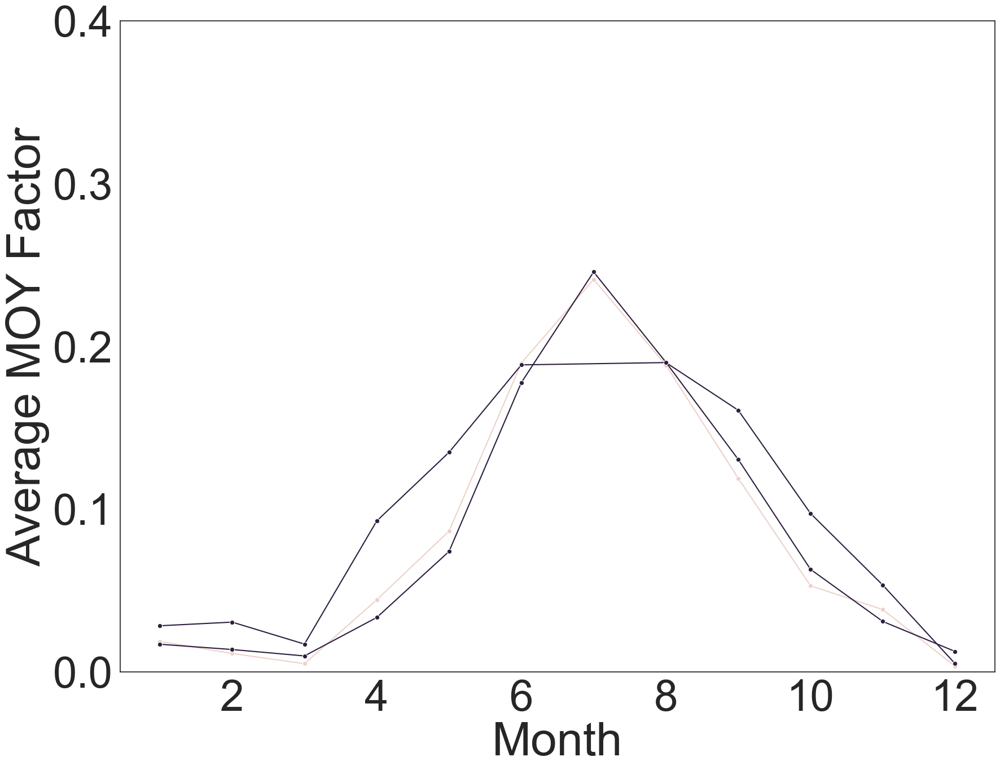

In [183]:
MOY_plot(d3m)

In [184]:
d3m['ID'].nunique()

3

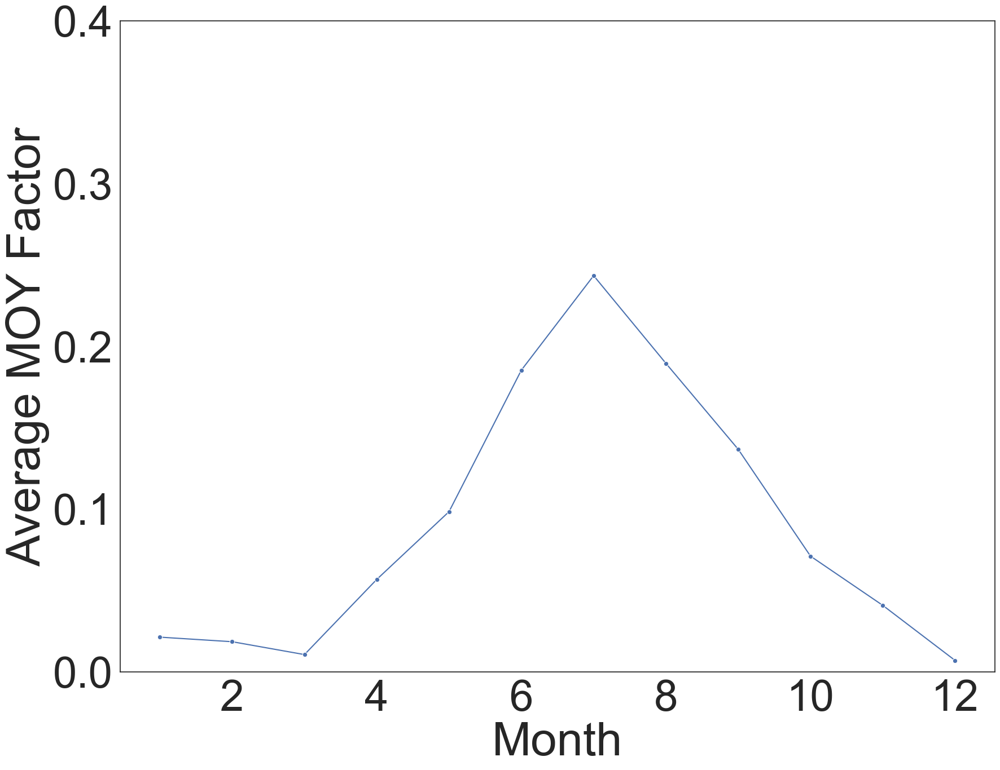

In [185]:
MOY_plot_ave(d3m_ave)

In [186]:
# export final MOY Factor by seasonality
d1m_ave['Criteria']='seasonal_factor<=2.4'
d2m_ave['Criteria']='2.4<seasonal_factor<=5'
d3m_ave['Criteria']='seasonal_factor>5'
final_MOY=pd.concat([d1m_ave,d2m_ave,d3m_ave],axis=0)
final_MOY.to_csv('H:/Desktop/Bike_ped Exposure Model Project/Final Factor/Final_MOY_Factor.csv')

# End of the Code